In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ["KERAS_BACKEND"] = "tensorflow"

import keras
print(keras.__version__)

seed = 42
keras.utils.set_random_seed(seed)
np.random.seed(seed)

import warnings
warnings.filterwarnings("ignore")

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

3.12.0


# 1. Fetching the datasets

## Training Dataset
Here, the training datasets for Fruit, Packages and Vegetables are loaded from the respective folders. Then, they're combined into a single training dataset through the `.concatenate` method. Before calling the method, though, the datasets must be properly off-set, so that class with ID = 0 in the second dataset doesn't get treated as the same class having ID = 0 in the first dataset.


In [74]:
from keras.utils import image_dataset_from_directory
base_path = '../GroceryStoreDataset/dataset/train'
fruit_path = os.path.join(base_path, 'Fruit')
veg_path = os.path.join(base_path, 'Vegetables')
pack_path = os.path.join(base_path, 'Packages')
#print(f"labels: {len(train_ds.class_names)}")

def get_num_classes(dataset):
    unique_labels = set()
    for _, labels in dataset:
        unique_labels.update(labels.numpy().flatten().tolist())
    return len(unique_labels)

def remap_labels(dataset, offset):
    return dataset.map(lambda image, label : (image, label+offset))


# load the fruit classes
fruit_ds = image_dataset_from_directory(
    directory=fruit_path,
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256)
)
fruit_classes = get_num_classes(fruit_ds)

# load the packages classes and off-set them
pack_ds = image_dataset_from_directory(
    directory=pack_path,
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256)
)
pack_classes = get_num_classes(pack_ds)
pack_ds_remapped = remap_labels(pack_ds, fruit_classes)

# first combination
temp_ds = fruit_ds.concatenate(pack_ds_remapped)

# load the vegetables classes and off-set them
veg_ds = image_dataset_from_directory(
    directory=veg_path,
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256)
)
veg_classes = get_num_classes(veg_ds)
veg_ds_remapped = remap_labels(veg_ds, get_num_classes(temp_ds))

# final dataset
train_ds = temp_ds.concatenate(veg_ds_remapped)
all_classes = get_num_classes(train_ds)
print(f"all_classes is: {all_classes}")

Found 1142 files belonging to 19 classes.
Found 864 files belonging to 9 classes.
Found 635 files belonging to 15 classes.
all_classes is: 43


In [83]:
import pandas as pd

df_classes_csv = pd.read_csv('../GroceryStoreDataset/dataset/classes.csv')
df = pd.DataFrame({
    'Coarse ID': range(len(df_classes_csv['Coarse Class Name (str)'].drop_duplicates().tolist())),
    'Coarse Name': df_classes_csv['Coarse Class Name (str)'].drop_duplicates().tolist()
})
print(df.to_string(index=False))


 Coarse ID    Coarse Name
         0          Apple
         1        Avocado
         2         Banana
         3           Kiwi
         4          Lemon
         5           Lime
         6          Mango
         7          Melon
         8      Nectarine
         9         Orange
        10         Papaya
        11  Passion-Fruit
        12          Peach
        13           Pear
        14      Pineapple
        15           Plum
        16    Pomegranate
        17 Red-Grapefruit
        18       Satsumas
        19          Juice
        20           Milk
        21       Oatghurt
        22       Oat-Milk
        23     Sour-Cream
        24      Sour-Milk
        25       Soyghurt
        26       Soy-Milk
        27        Yoghurt
        28      Asparagus
        29      Aubergine
        30        Cabbage
        31        Carrots
        32       Cucumber
        33         Garlic
        34         Ginger
        35           Leek
        36       Mushroom
        37  

### Code to check if concatenation worked

With this, you can request one of the classes of the datasets and see all related pictures. The index is 0-based and matches the othe described in the table returned by the above snippet of code (I.e. to get the class with coarse_ID = 25, you must use parameter 25).

WARNING: Because of a mistake in the way folders are labelled, there's a mismatch with the *classes.csv* file for the Vegetables. Specifically, the *.csv* states that ID = 36 belongs to Mushroom. However, the folder is actually named Brown-Capped Mushroom, which makes it one of the first entries for the Vegetables category (ID = 2). Refer to the label assignment reproduced in the cell above.

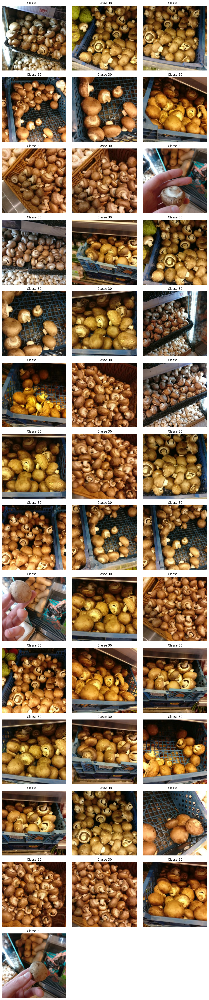

In [92]:
import matplotlib.pyplot as plt

def show_images_from_class(dataset, target_class):    
    filtered_ds = dataset.unbatch().filter(
        lambda image, label: label == target_class
    )
    
    images = []
    for image, label in filtered_ds:
        images.append(image.numpy())
    
    if len(images) == 0:
        print(f"Nessuna immagine trovata per la classe {target_class}")
        return
    
    n = len(images)
    cols = 3
    rows = (n + cols - 1) // cols
    
    plt.figure(figsize=(12, 4 * rows))
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img.astype('uint8'))
        plt.title(f'Classe {target_class}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
show_images_from_class(train_ds, target_class=30)

In [89]:
def load_data_from_dataset(dataset):
    images = []
    labels = []
    
    for image_batch, label_batch in dataset:
        images.append(image_batch.numpy())
        labels.append(label_batch.numpy())
    
    x_train = np.concatenate(images, axis=0)
    y_train = np.concatenate(labels, axis=0)
    
    return x_train, y_train

(x_train, y_train) = load_data_from_dataset(train_ds)
print(x_train.shape)

(2641, 256, 256, 3)
